In [1]:
from collections import defaultdict
import torch
from torchvision.models import resnet50, ResNet50_Weights
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms
from tqdm import tqdm
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
import torch.nn.functional as F_nn
import seaborn as sns
import numpy as np
import pandas as pd
import time

method_timing = {}

# Import ResNet, set to evaluation mode
model = resnet50(weights=ResNet50_Weights.DEFAULT)
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 173MB/s]


In [2]:
def calculate_channel_attributions(img):
    img.requires_grad_()

    # Forward pass up to last layer
    x = model.conv1(img)
    x = model.bn1(x)
    x = model.relu(x)
    x = model.maxpool(x)

    x = model.layer1(x)
    x = model.layer2(x)
    x = model.layer3(x)
    last_layer_activations = model.layer4(x)  # (1, 2048, 7, 7)

    # Compute avgpool and FC manually
    avgpool = torch.nn.AdaptiveAvgPool2d((1, 1))
    pooled = avgpool(last_layer_activations)
    flattened = pooled.view(pooled.size(0), -1)
    logits = model.fc(flattened)  # (1, 1000)

    # Select target logit
    target_logit = logits[0, logits.argmax(dim=1)]

    # Compute gradient of target logit wrt last layer activations
    grads = torch.autograd.grad(target_logit, last_layer_activations)[0]

    # Sum gradients across spatial dimensions
    attributions = grads.sum(dim=(2, 3)).abs().squeeze()

    return attributions, last_layer_activations.detach()


In [3]:
def calculate_ig_attributions(img, baseline=None, steps=50):
    # Initialize baseline if not provided
    if baseline is None:
        baseline = torch.zeros_like(img)  # Using zero as baseline

    # Ensure baseline and input are on same device
    img = img.to(baseline.device)

    # Initialize attributions tensor to accumulate gradients across steps
    attributions = torch.zeros(2048, dtype=img.dtype, device=img.device)

    # Compute Integrated Gradients by averaging over multiple steps
    for step in range(steps):
        # Compute interpolation coefficient (alpha)
        alpha = (step + 1) / steps

        # Create interpolated input
        interpolated_input = baseline * (1 - alpha) + img * alpha
        interpolated_input.requires_grad_()

        # Forward pass through the model up to last layer activations
        x = model.conv1(interpolated_input)
        x = model.bn1(x)
        x = model.relu(x)
        x = model.maxpool(x)

        x = model.layer1(x)
        x = model.layer2(x)
        x = model.layer3(x)
        last_layer_activations_step = model.layer4(x)  # (1, 2048, 7, 7)

        # Compute avgpool and FC manually
        avgpool = torch.nn.AdaptiveAvgPool2d((1, 1))
        pooled = avgpool(last_layer_activations_step)
        flattened = pooled.view(pooled.size(0), -1)
        logits = model.fc(flattened)  # (1, 1000)

        # Select target logit
        target_logit = logits[0, logits.argmax(dim=1)]

        # Compute gradient of target logit with respect to last layer activations for this step
        grads = torch.autograd.grad(target_logit, last_layer_activations_step)[0]

        # Sum gradients across spatial dimensions and accumulate
        channel_grads = grads.sum(dim=(2, 3)).abs().squeeze()
        attributions += channel_grads

    # Average the accumulated gradients over all steps to get final IG attributions
    attributions /= steps

    return attributions, last_layer_activations_step.detach()



In [4]:
# --------------------------------------------------------------------------------------------------------------
# Boris section begin
# added visualization method
def visualize_activation_on_image(image_tensor, activation_map, title=""):
    # bring image back to PIL-format (reversing normalization of the network such that human can intepret again)
    img = image_tensor.squeeze(0).cpu()
    img = F.to_pil_image(img)

    # interpolate the 7x7 activation map to 224x224 to overlay it and normalize it to ensure proper colors in the heatmap
    act = activation_map.unsqueeze(0).unsqueeze(0)
    act = F_nn.interpolate(act, size=(224, 224), mode="bilinear", align_corners=False).squeeze()
    act -= act.min()
    act /= act.max()

    # plot
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.imshow(act.cpu(), cmap='jet', alpha=0.5)  # heatmap drüber
    plt.title(title)
    plt.axis("off")
    plt.show()


In [5]:
# Adding InputXGradient
def inputxgradient_channel_attributions(img):
    img.requires_grad_()

    # Forward pass up to last conv layer
    x = model.conv1(img)
    x = model.bn1(x)
    x = model.relu(x)
    x = model.maxpool(x)
    x = model.layer1(x)
    x = model.layer2(x)
    x = model.layer3(x)
    activations = model.layer4(x)  # shape: (1, 2048, 7, 7)

    # Clone and retain grad for attribution
    activations = activations.clone().detach().requires_grad_()

    # Complete forward
    pooled = torch.nn.functional.adaptive_avg_pool2d(activations, (1, 1))
    logits = model.fc(pooled.view(pooled.size(0), -1))

    # Target logit
    target_logit = logits[0, logits.argmax(dim=1)]

    # Compute gradients w.r.t. activations
    grads = torch.autograd.grad(target_logit, activations)[0]

    # Input × Grad at activation level
    input_x_grad = grads * activations  # shape: (1, 2048, 7, 7)
    channel_attributions = input_x_grad.sum(dim=(2, 3)).squeeze().abs()

    return channel_attributions, activations.detach()


# smoothgrad implmenation with adjustmenets (batch size in forward) to speed up the process
def smoothgrad_channel_attributions(img):
    img = img.detach()
    noise_std = 0.15
    all_inputxgrads = []

    for _ in range(15):
        img_noisy = img + noise_std * torch.randn_like(img)
        img_noisy = img_noisy.detach().requires_grad_()

        # Forward to activations
        x = model.conv1(img_noisy)
        x = model.bn1(x)
        x = model.relu(x)
        x = model.maxpool(x)
        x = model.layer1(x)
        x = model.layer2(x)
        x = model.layer3(x)
        activations = model.layer4(x)
        activations = activations.clone().detach().requires_grad_()

        pooled = torch.nn.functional.adaptive_avg_pool2d(activations, (1, 1))
        logits = model.fc(pooled.view(pooled.size(0), -1))
        target_logit = logits[0, logits.argmax(dim=1)]

        grads = torch.autograd.grad(target_logit, activations)[0]
        inputxgrad = grads * activations
        all_inputxgrads.append(inputxgrad.detach())

    avg_inputxgrad = torch.stack(all_inputxgrads, dim=0).mean(dim=0)
    channel_attributions = avg_inputxgrad.sum(dim=(2, 3)).squeeze().abs()

    return channel_attributions, activations.detach(), avg_inputxgrad.detach()


def gradcam_channel_attributions(img):
    activation = {}
    gradient = {}


    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook


    def get_gradient(name):
        def hook(model, input, output):
            gradient[name] = output[0].detach()
        return hook

    # register hooks
    h1 = model.layer4[2].conv3.register_forward_hook(get_activation('last_layer'))
    h2 = model.layer4[2].conv3.register_backward_hook(get_gradient('last_layer'))

    # forward pass
    img.requires_grad = True
    output = model(img)
    activation_last_layer = activation["last_layer"]

    # backward pass
    prediction = output.argmax(dim=1)
    prediction_output = torch.gather(output, 1, prediction.unsqueeze(-1))
    gradients_input = torch.autograd.grad(prediction_output, img, create_graph=False)[0]
    gradients_last_layer = gradient['last_layer']

    # global average pooling
    gradients_last_layer = gradients_last_layer.mean(-1).mean(-1).unsqueeze(-1).unsqueeze(-1)

    # Grad-CAM
    weighted_activation = activation_last_layer * gradients_last_layer

    # calculate channel attribtuions
    channel_attributions = weighted_activation.mean(dim=(2, 3)).squeeze()

    #Grad-CAM Map
    grad_cam = torch.nn.functional.relu(weighted_activation.sum(dim=1, keepdim=True))
    up = torch.nn.Upsample(scale_factor=32, mode='bilinear')
    grad_cam = up(grad_cam)

    # visualize
    gradients_plot = grad_cam[0].abs().sum(dim=0).detach().cpu().numpy()
    if gradients_plot.max() > 0:
        gradients_plot = gradients_plot / gradients_plot.max()
    else:
        gradients_plot = gradients_plot

    # unlock hoocks
    h1.remove()
    h2.remove()

    # return attribtions and original grad_cam map
    return channel_attributions.abs(), activation_last_layer, grad_cam

# Which methods recognize the same (polysemantic) channels?
def jaccard(a, b):
    union = a | b
    if len(union) == 0:
        return 0.0
    return len(a & b) / len(union)



In [57]:
def compare_methods_on_image(img_tensor, model, methods=["vanilla", "inputxgrad", "smoothgrad", "gradcam", "ig"]):
    device = next(model.parameters()).device
    img_tensor = img_tensor.to(device)
    method_maps = {}
    top_channels = {}  # store top channel per method
    titles = {
        "vanilla": "Vanilla Gradient",
        "inputxgrad": "Input × Gradient",
        "smoothgrad": "SmoothGrad",
        "gradcam": "Grad-CAM",
        "ig": "Integrated Gradients"
    }

    for method in methods:
        if method == "vanilla":
            attributions, activations = calculate_channel_attributions(img_tensor)
            top_channel = attributions.argmax().item()
            heatmap = activations[0, top_channel].unsqueeze(0).unsqueeze(0)
            heatmap = F_nn.interpolate(heatmap, size=(224, 224), mode="bilinear", align_corners=False).squeeze()

        elif method == "inputxgrad":
            attributions, activations = inputxgradient_channel_attributions(img_tensor)
            top_channel = attributions.argmax().item()
            heatmap = activations[0, top_channel].unsqueeze(0).unsqueeze(0)
            heatmap = F_nn.interpolate(heatmap, size=(224, 224), mode="bilinear", align_corners=False).squeeze()

        elif method == "smoothgrad":
            attributions, activations, gradients = smoothgrad_channel_attributions(img_tensor)
            top_channel = attributions.argmax().item()
            heatmap = activations[0, top_channel].unsqueeze(0).unsqueeze(0)
            heatmap = F_nn.interpolate(heatmap, size=(224, 224), mode="bilinear", align_corners=False).squeeze()

        elif method == "gradcam":
            _, _, grad_cam_map = gradcam_channel_attributions(img_tensor)
            top_channel = attributions.argmax().item()
            heatmap = grad_cam_map.squeeze()
            # top_channel = None  # Grad-CAM is usually a full map, no single channel

        elif method == "ig":
            attributions, activations = calculate_ig_attributions(img_tensor)
            top_channel = attributions.argmax().item()
            heatmap = activations[0, top_channel].unsqueeze(0).unsqueeze(0)
            heatmap = F_nn.interpolate(heatmap, size=(224, 224), mode="bilinear", align_corners=False).squeeze()

        else:
            continue

        # Normalize heatmap
        heatmap -= heatmap.min()
        if heatmap.max() > 0:
            heatmap /= heatmap.max()
        method_maps[method] = heatmap.detach().cpu()
        top_channels[method] = top_channel

    # Convert image back for visualization
    img = img_tensor.squeeze(0).cpu()
    img_pil = F.to_pil_image(img)

    # Plotting all maps
    fig, axes = plt.subplots(1, len(method_maps), figsize=(5 * len(method_maps), 5))
    if len(method_maps) == 1:
        axes = [axes]  # ensure iterable

    for ax, (method, heatmap) in zip(axes, method_maps.items()):
        ax.imshow(img_pil)
        ax.imshow(heatmap, cmap='jet', alpha=0.5)

        # Add top channel to title if available
        if top_channels[method] is not None:
            title = f"{titles.get(method, method)} - top channel {top_channels[method]}"
        else:
            title = titles.get(method, method)

        ax.set_title(title, fontsize=12)
        ax.axis("off")

    plt.suptitle("Visual Comparison of Attribution Methods on the Same Input", fontsize=14)
    plt.tight_layout()
    plt.show()


In [60]:
selected_methods = ["ig", "vanilla", "inputxgrad", "smoothgrad", "gradcam"]

# do the methods agree on polysemantic channels?
per_class_poly = defaultdict(lambda: defaultdict(set))

# Import ResNet, set to evaluation mode
model = resnet50(weights=ResNet50_Weights.DEFAULT)
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Load validation split of the ImageNet dataset, apply transforms, init data loader
transform = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(224),transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

#Run this in terminal
#wget http://www.image-net.org/data/ILSVRC/2012/ILSVRC2012_img_val.tar
#wget https://image-net.org/data/ILSVRC/2012/ILSVRC2012_devkit_t12.tar.gz
data = datasets.ImageNet(
    root="/content",
    split="val",
    transform=transform
)
loader = DataLoader(data,  batch_size=1,shuffle=True,)


n_labels = 1000
n_channels = 2048


Running method: ig


30it [00:17,  1.70it/s]


[Timing] Method 'ig' took 17.67 seconds

Top polysemantic channels for method: ig
  #1: Channel 1008 → 1
  #2: Channel 108 → 1
  #3: Channel 494 → 1
  #4: Channel 902 → 1
  #5: Channel 1115 → 1
  #6: Channel 352 → 1
  #7: Channel 1233 → 1
  #8: Channel 1217 → 1
  #9: Channel 145 → 1
  #10: Channel 1158 → 1

Running method: vanilla


30it [00:04,  7.36it/s]


[Timing] Method 'vanilla' took 4.08 seconds

Top polysemantic channels for method: vanilla
  #1: Channel 758 → 1
  #2: Channel 1178 → 1
  #3: Channel 723 → 1
  #4: Channel 1872 → 1
  #5: Channel 1519 → 1
  #6: Channel 1631 → 1
  #7: Channel 973 → 1
  #8: Channel 1060 → 1
  #9: Channel 1299 → 1
  #10: Channel 1340 → 1

Running method: inputxgrad


30it [00:03,  7.67it/s]


[Timing] Method 'inputxgrad' took 3.91 seconds

Top polysemantic channels for method: inputxgrad
  #1: Channel 1146 → 4
  #2: Channel 1574 → 3
  #3: Channel 1534 → 2
  #4: Channel 1827 → 2
  #5: Channel 406 → 2
  #6: Channel 2015 → 2
  #7: Channel 230 → 2
  #8: Channel 540 → 2
  #9: Channel 1183 → 2
  #10: Channel 1933 → 2

Running method: smoothgrad


30it [00:07,  3.86it/s]


[Timing] Method 'smoothgrad' took 7.77 seconds

Top polysemantic channels for method: smoothgrad
  #1: Channel 1893 → 2
  #2: Channel 1935 → 2
  #3: Channel 8 → 2
  #4: Channel 694 → 2
  #5: Channel 1070 → 2
  #6: Channel 1745 → 2
  #7: Channel 1183 → 2
  #8: Channel 435 → 1
  #9: Channel 535 → 1
  #10: Channel 1110 → 1

Running method: gradcam


30it [00:03,  8.17it/s]


[Timing] Method 'gradcam' took 3.67 seconds

Top polysemantic channels for method: gradcam
  #1: Channel 1146 → 15
  #2: Channel 1574 → 11
  #3: Channel 1808 → 8
  #4: Channel 1558 → 7
  #5: Channel 1382 → 2
  #6: Channel 1101 → 2
  #7: Channel 2011 → 2
  #8: Channel 725 → 2
  #9: Channel 1183 → 2
  #10: Channel 1457 → 2

[Visualization] Best image for method 'ig' with 1 important channels


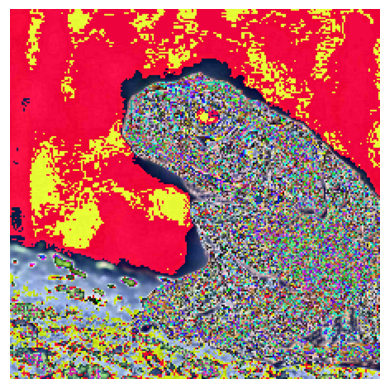

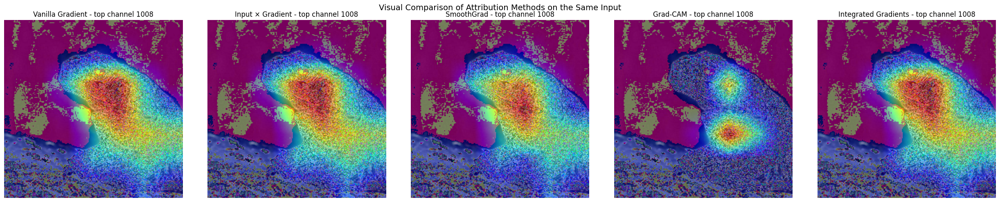


[Visualization] Best image for method 'vanilla' with 1 important channels


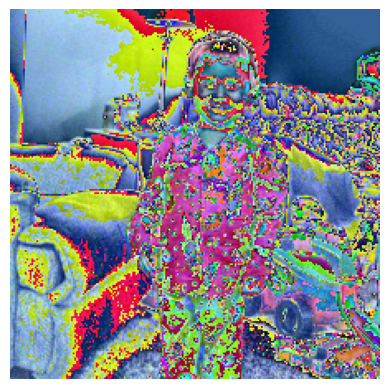

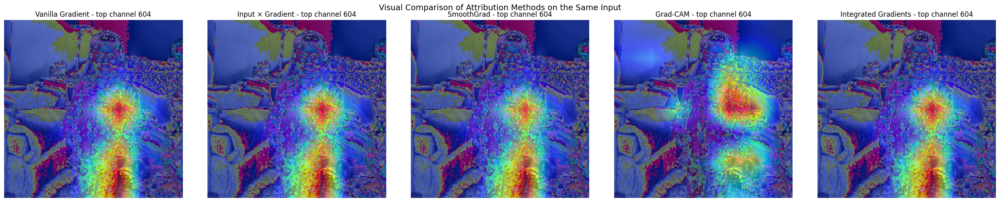


[Visualization] Best image for method 'inputxgrad' with 11 important channels


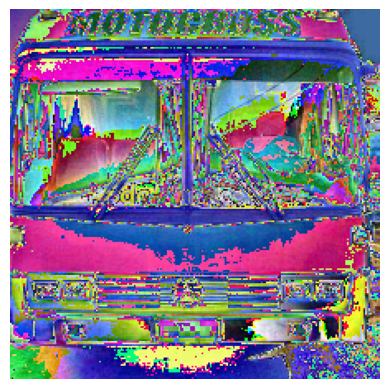

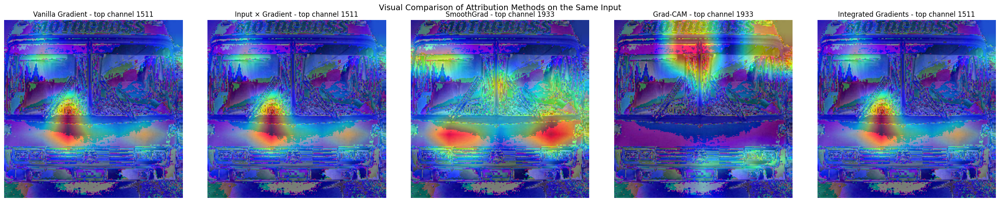


[Visualization] Best image for method 'smoothgrad' with 13 important channels


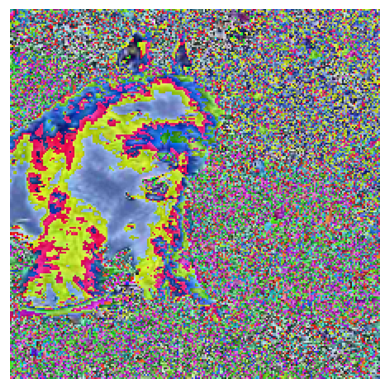

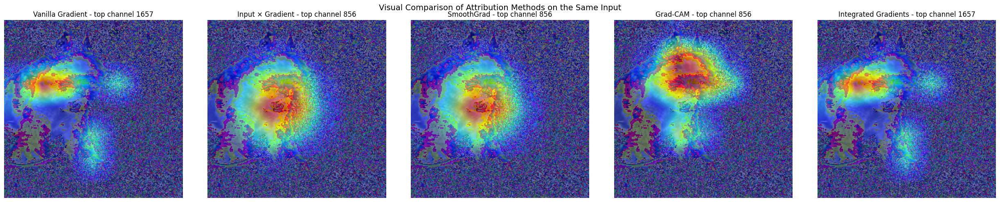


[Visualization] Best image for method 'gradcam' with 12 important channels


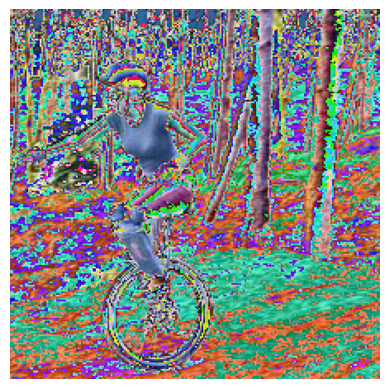

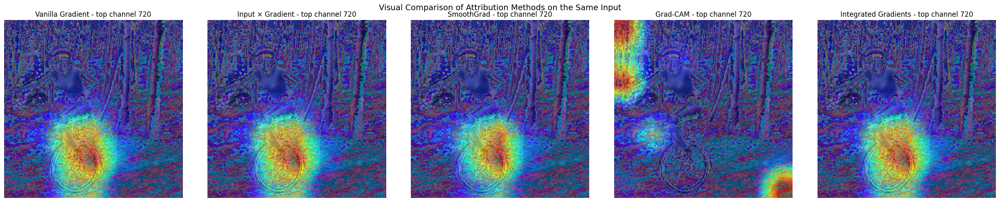

In [61]:
# Create variables for saving stats
label_counts = [0 for l in range(n_labels)]
important_channels = [defaultdict(int) for l in range(n_labels)]
poly = defaultdict(int)




best_img_per_method = {}
max_channels_per_method = {}
poly_per_method = defaultdict(lambda: defaultdict(int))

# For each image
for method_name in selected_methods:
    max_channels = 0
    best_img = None
    print(f"\nRunning method: {method_name}")
    label_counts = [0 for _ in range(n_labels)]
    important_channels = [defaultdict(int) for _ in range(n_labels)]
    poly = defaultdict(int)

    start_time = time.time()


    for idx, (img, label) in tqdm(enumerate(loader)):
        img = img.to(device)
        # Increase label count
        label_counts[label] += 1

        if idx >= 30:
             break  # use first 10000 images



        # ------------------------------------------------------------------------------------
        # Boris begin

        if method_name == "vanilla":
            img_attributions, last_activations = calculate_channel_attributions(img)
        elif method_name == "inputxgrad":
            img_attributions, last_activations = inputxgradient_channel_attributions(img)
        elif method_name == "smoothgrad":
            img_attributions, last_activations, smoothgrad_gradients = smoothgrad_channel_attributions(img)
        elif method_name == "gradcam":
            img_attributions, last_activations, grad_cam_map = gradcam_channel_attributions(img)
        elif method_name == "ig":
            img_attributions, last_activations = calculate_ig_attributions(img)

        total = img_attributions.sum()
        count = (img_attributions >= 0.02 * total).sum().item()
        if count > max_channels:
            max_channels = count
            if method_name == "smoothgrad":
                best_img = (
                    img.cpu().detach(),
                    last_activations.cpu().detach(),
                    img_attributions.cpu().detach(),
                    smoothgrad_gradients.cpu().detach()
                )
            else:
                best_img = (
                    img.cpu().detach(),
                    last_activations.cpu().detach(),
                    img_attributions.cpu().detach()
                )
        # Boris end
        # ---------------------------------------------------------------------------------------------



        # Find important channels for the image
        # -> Attribution >= 2% of total
        sum_attributions = sum(img_attributions)
        for c in range(n_channels):
            if img_attributions[c] >= 0.02 * sum_attributions:
                important_channels[label][c] += 1

            # timing of the methods
    end_time = time.time()
    method_timing[method_name] = end_time - start_time
    print(f"[Timing] Method '{method_name}' took {end_time - start_time:.2f} seconds")



    # Find polysemantic channels
    # -> Important in >= 75% images with a specified label
    for l in range(n_labels):
        if important_channels[l]:
            for c in range(n_channels):
                if important_channels[l][c] >= 0.75 * label_counts[l]:
                    poly_per_method[method_name][c] += 1
                    per_class_poly[method_name][l].add(c)

    # Ausgabe für aktuelle Methode
    top_poly_channels = sorted(poly_per_method[method_name].items(), key=lambda x: x[1], reverse=True)
    print(f"\nTop polysemantic channels for method: {method_name}")
    if not top_poly_channels:
        print("  (None found)")
    else:
        for i, (ch, count) in enumerate(top_poly_channels[:10]):
            print(f"  #{i + 1}: Channel {ch} → {count}")





# ------------------------------------------------------------------------------------
# Boris begin
    best_img_per_method[method_name] = best_img
    max_channels_per_method[method_name] = max_channels


for method_name, best in best_img_per_method.items():
    if best is None:
        continue

    if method_name == "smoothgrad":
        img_tensor, activations, attributions, smoothgrad_gradients = best
    else:
        img_tensor, activations, attributions = best

    print(f"\n[Visualization] Best image for method '{method_name}' with {max_channels_per_method[method_name]} important channels")



    # top_channel, _ = max(poly_per_method[method_name].items(), key=lambda x: x[1])
    # for idx, (img, label) in enumerate(loader):
    #     print(idx)
    #     if idx >= 50:   # stop after 50 iterations
    #       break
    #     img = img.to(device)

    #     if method_name == "vanilla":
    #         attributions, activations = calculate_channel_attributions(img)
    #     elif method_name == "inputxgrad":
    #         attributions, activations = inputxgradient_channel_attributions(img)
    #     elif method_name == "smoothgrad":
    #         attributions, activations, _ = smoothgrad_channel_attributions(img)
    #     elif method_name == "gradcam":
    #         attributions, activations, _ = gradcam_channel_attributions(img)
    #     elif method_name == "ig":
    #         attributions, activations = calculate_ig_attributions(img)
    #     else:
    #         continue

    #     sum_attr = attributions.sum()
    #     if attributions[top_channel] >= 0.02 * sum_attr:
    #         activation_map = activations[0, top_channel].detach().cpu()
    #         visualize_activation_on_image(img.cpu(), activation_map, title=f"[{method_name}] Most Polysem. Channel {top_channel}")
    #         break
    # Remove batch dimension: [1, 3, 224, 224] -> [3, 224, 224]
    img = img_tensor.squeeze(0).cpu()  # move to CPU if necessary
    import matplotlib.pyplot as plt
    import torchvision.transforms.functional as TF
    # Convert to PIL Image
    img_pil = TF.to_pil_image(img)

    # Display
    plt.imshow(img_pil)
    plt.axis('off')
    plt.show()

    compare_methods_on_image(img_tensor, model)


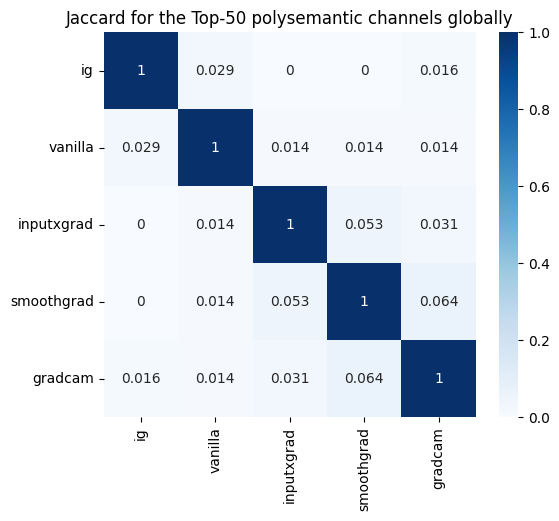

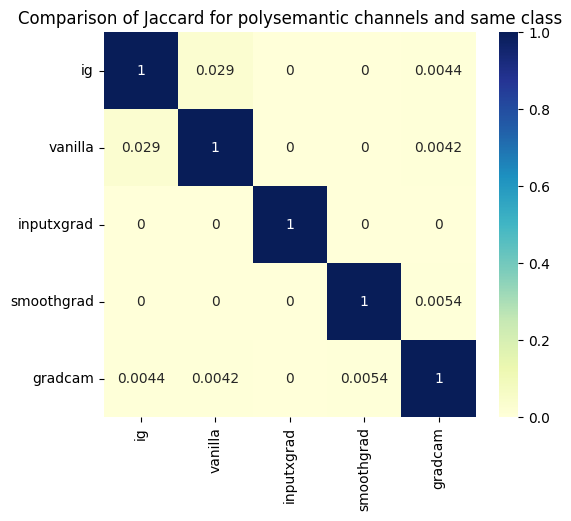

In [63]:

# plot of how often a channel appears globally in the methods (over all classes). So which channels dominate globally
methods = list(poly_per_method.keys())
topk = 50
similarity_matrix = np.zeros((len(methods), len(methods)))

for i, m1 in enumerate(methods):
    top_m1 = set([c for c, _ in sorted(poly_per_method[m1].items(), key=lambda x: x[1], reverse=True)[:topk]])
    for j, m2 in enumerate(methods):
        top_m2 = set([c for c, _ in sorted(poly_per_method[m2].items(), key=lambda x: x[1], reverse=True)[:topk]])
        similarity_matrix[i, j] = jaccard(top_m1, top_m2)

# plotting
plt.figure(figsize=(6, 5))
sns.heatmap(similarity_matrix, xticklabels=methods, yticklabels=methods, annot=True, cmap="Blues", vmin=0, vmax=1)
plt.title(f"Jaccard for the Top-{topk} polysemantic channels globally")
plt.show()


# Comparison if methods agree on the same relevant channels for the classification
classwise_similarity = np.zeros((len(methods), len(methods)))
for i, m1 in enumerate(methods):
    for j, m2 in enumerate(methods):
        inter = 0
        union = 0
        for l in range(n_labels):
            s1 = per_class_poly[m1][l]
            s2 = per_class_poly[m2][l]
            if s1 or s2:
                inter += len(s1 & s2)
                union += len(s1 | s2)
        classwise_similarity[i, j] = inter / union if union > 0 else 0.0

plt.figure(figsize=(6, 5))
sns.heatmap(classwise_similarity, xticklabels=methods, yticklabels=methods, annot=True, cmap="YlGnBu", vmin=0, vmax=1)
plt.title("Comparison of Jaccard for polysemantic channels and same class")
plt.show()

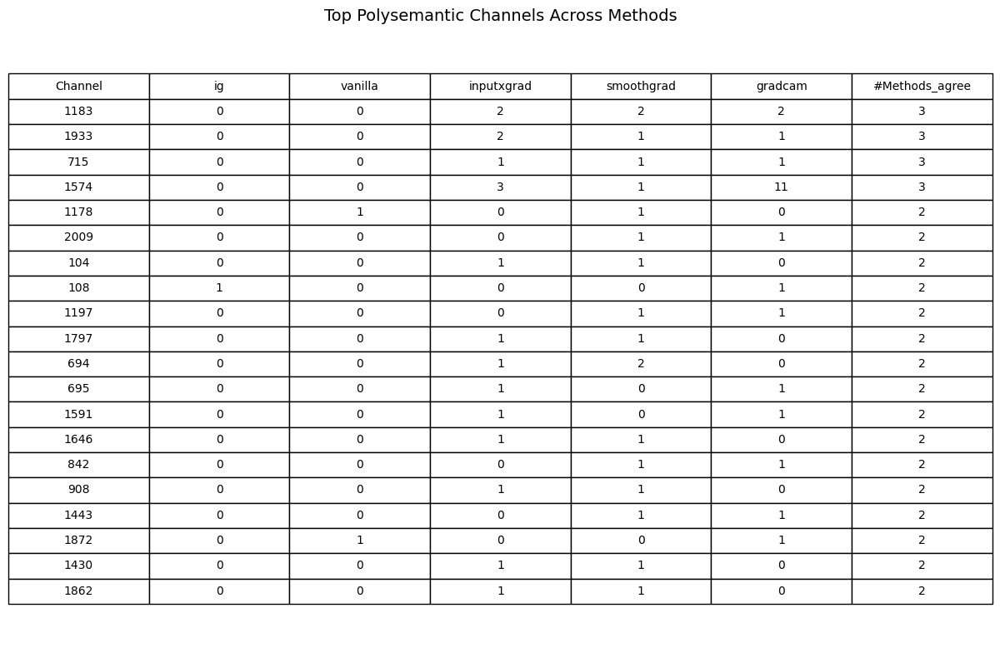

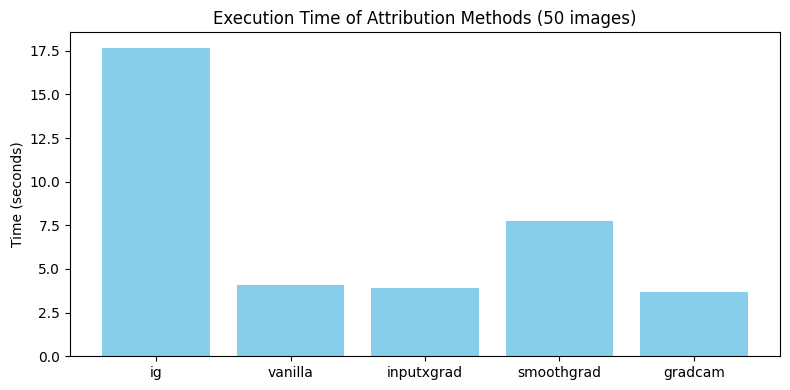

In [64]:

# Building a Dataframe to visualize each polysemantic channel and compare it to every other method
all_channels = set()
for method in poly_per_method:
    all_channels.update(poly_per_method[method].keys())
data = []
for ch in sorted(all_channels):
    row = {'Channel': ch}
    for method in methods:
        row[method] = poly_per_method[method].get(ch, 0)
    row["#Methods_agree"] = sum(row[m] > 0 for m in methods)
    data.append(row)

df = pd.DataFrame(data)
df = df.sort_values(by="#Methods_agree", ascending=False)


# Visualize polysemantic channel and compare it to every other method
def visualize_dataframe_as_table(df, title="Polysemantic Channel Agreement"):
    fig, ax = plt.subplots(figsize=(12, len(df) * 0.35 + 1))
    ax.axis("off")
    table = ax.table(cellText=df.values,
                     colLabels=df.columns,
                     loc='center',
                     cellLoc='center',
                     colLoc='center')
    table.scale(1.2, 1.5)
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    plt.title(title, fontsize=14)
    plt.tight_layout()
    plt.show()









visualize_dataframe_as_table(df.head(20), title="Top Polysemantic Channels Across Methods")


plt.figure(figsize=(8, 4))
plt.bar(method_timing.keys(), method_timing.values(), color='skyblue')
plt.title("Execution Time of Attribution Methods (50 images)")
plt.ylabel("Time (seconds)")
plt.tight_layout()
plt.show()